<img src="https://user-images.githubusercontent.com/26833433/82952157-51b7db00-9f5d-11ea-8f4b-dda1ffecf992.jpg">

This notebook was written by Ultralytics LLC, and is freely available for redistribution under the [GPL-3.0 license](https://choosealicense.com/licenses/gpl-3.0/). 
For more information please visit https://github.com/ultralytics/yolov5 and https://www.ultralytics.com.

# Setup

Clone repo, install dependencies, `%cd` into `./yolov5` folder and check GPU.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd "/content/drive/My Drive/"
!git clone https://github.com/ultralytics/yolov5  # clone repo
!pip install -qr yolov5/requirements.txt  # install dependencies (ignore errors)
%cd yolov5

import torch
from IPython.display import Image, clear_output  # to display images
from utils.google_utils import gdrive_download  # to download models/datasets

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.7.0+cu101 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15079MB, multi_processor_count=40)


In [ ]:
import os


# 2. Test
Test a model on COCO val or test-dev dataset to determine trained accuracy. Models are auto-downloaded from [Google Drive](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J). To show results by class use the `--verbose` flag. Note that `pycocotools` metrics may be 1-2% better than the equivalent repo metrics, as is visible below, due to slight differences in mAP computation.

### 2.1 val
Download COCO val 2017 dataset, 1GB, 5000 images, and test model accuracy.

In [ ]:
'''
"ambulance": class_no=0
  if name=="auto rickshaw": class_no=1
  if name=="bicycle": class_no=2
  if name=="bus": class_no=3
  if name=="car": class_no=4
  if name=="garbage van": class_no=5
  if name=="human hauler": class_no=6
  if name=="minibus": class_no=7
  if name=="minivan": class_no=8
  if name=="motorbike": class_no=9
  if name=="pickup": class_no=10
  if name=="army vehicle": class_no=11
  if name=="policecar": class_no=12
  if name=="rickshaw": class_no=13
  if name=="scooter": class_no=14
  if name=="suv": class_no=15
  if name=="taxi": class_no=16
  if name=="three wheelers (CNG)": class_no=17
  if name=="truck": class_no=18
  if name=="van": class_no=19
  if name=="wheelbarrow": class_no=20

  ["ambulance", "auto rickshaw", "bicycle", "bus", "car", "garbage van", "human hauler", "minibus", "minivan", "motorbike", "pickup", "army vehicle", 
   "policecar", "rickshaw", "scooter", "suv", "taxi", "three wheelers (CNG)", "truck", "van", "wheelbarrow" ]
   '''

In [ ]:
import yaml

data = dict(
    train =  '/content/drive/My Drive/dhaka_traffic/images/train_image' ,
    val   =  '/content/drive/My Drive/dhaka_traffic/images/val_image' ,
    nc    = 21,
    names = ["ambulance", "auto rickshaw", "bicycle", "bus", "car", "garbage van", "human hauler", "minibus", "minivan", "motorbike", "pickup", "army vehicle", 
   "policecar", "rickshaw", "scooter", "suv", "taxi", "three wheelers (CNG)", "truck", "van", "wheelbarrow" ]
    )

with open('/content/dhaka_traffic.yaml', 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

In [ ]:
f = open("/content/dhaka_traffic.yaml", 'r')
f.read()

'names:\n- ambulance\n- auto rickshaw\n- bicycle\n- bus\n- car\n- garbage van\n- human hauler\n- minibus\n- minivan\n- motorbike\n- pickup\n- army vehicle\n- policecar\n- rickshaw\n- scooter\n- suv\n- taxi\n- three wheelers (CNG)\n- truck\n- van\n- wheelbarrow\nnc: 21\ntrain: /content/drive/My Drive/dhaka_traffic/images/train_image\nval: /content/drive/My Drive/dhaka_traffic/images/val_image\n'

# 3. Train

Download https://www.kaggle.com/ultralytics/coco128, a small 128-image tutorial dataset, start tensorboard and train YOLOv5s from a pretrained checkpoint for 3 epochs (actual training is much longer, around **300-1000 epochs**, depending on your dataset).

Train a YOLOv5s model on coco128 by specifying model config file `--cfg models/yolo5s.yaml`, and dataset config file `--data data/coco128.yaml`. Start training from pretrained `--weights yolov5s.pt`, or from randomly initialized `--weights ''`. Pretrained weights are auto-downloaded from [Google Drive](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J).

**All training results are saved to `runs/exp0`** for the first experiment, then `runs/exp1`, `runs/exp2` etc. for subsequent experiments.


In [ ]:
# Start tensorboard (optional)
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
%cd "/content/drive/My Drive/yolov5"

/content/drive/My Drive/yolov5


In [ ]:
# Train YOLOv5s on coco128 for 3 epochs
!python train.py --img 640 --batch 16 --epochs 30 --data "/content/dhaka_traffic.yaml" --cfg yolov5s.yaml --weights "/content/drive/My Drive/yolov5/runs/exp4/weights/last.pt" --nosave --cache

Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='/content/dhaka_traffic.yaml', device='', epochs=30, evolve=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], local_rank=-1, logdir='runs/', multi_scale=False, name='', noautoanchor=False, nosave=True, notest=False, rect=False, resume=False, single_cls=False, sync_bn=False, total_batch_size=16, weights='/content/drive/My Drive/yolov5/runs/exp4/weights/last.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/", view at http://localhost:6006/
2020-10-16 03:50:21.164609: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, '

# 4. Visualize

View `runs/exp0/train*.jpg` images to see training images, labels and augmentation effects. A **Mosaic Dataloader** is used for training (shown below), a new concept developed by Ultralytics and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

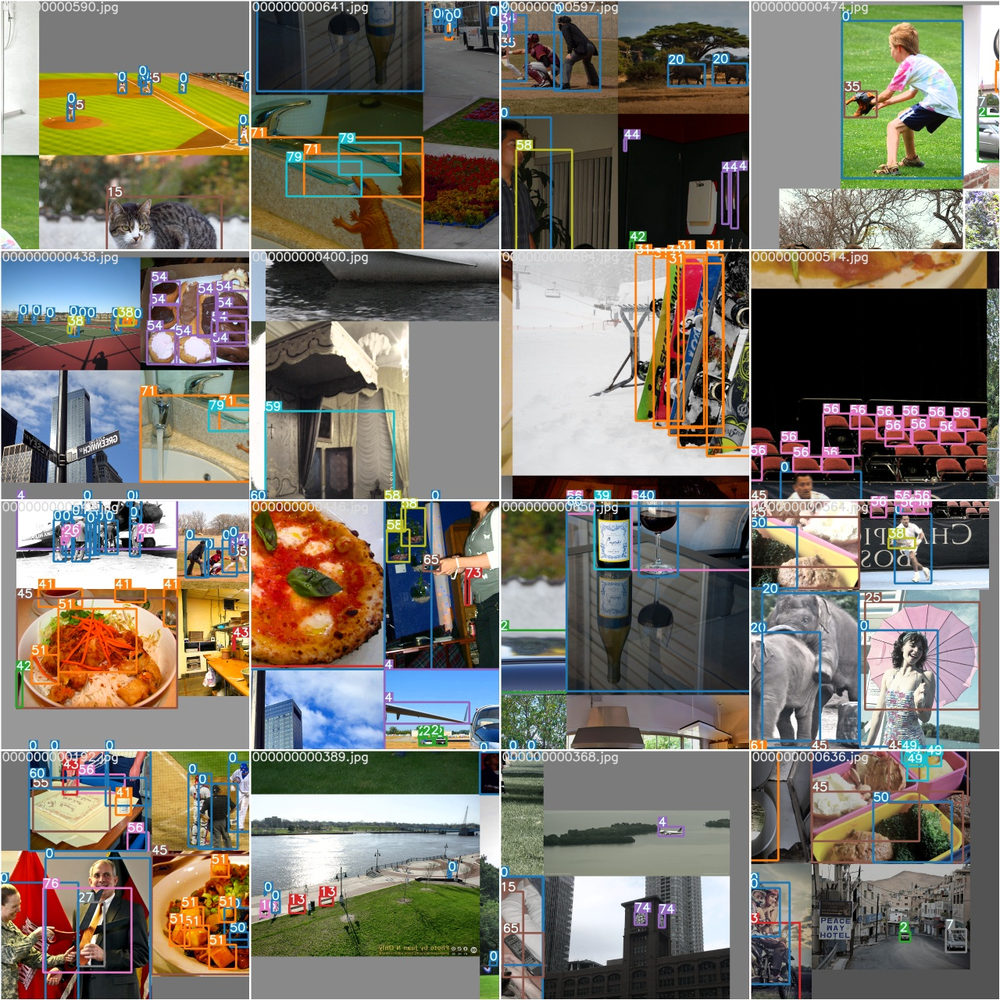

In [ ]:
Image(filename='runs/exp0/train_batch1.jpg', width=900)  # view augmented training mosaics

View `test_batch0_gt.jpg` to see test batch 0 *ground truth* labels.

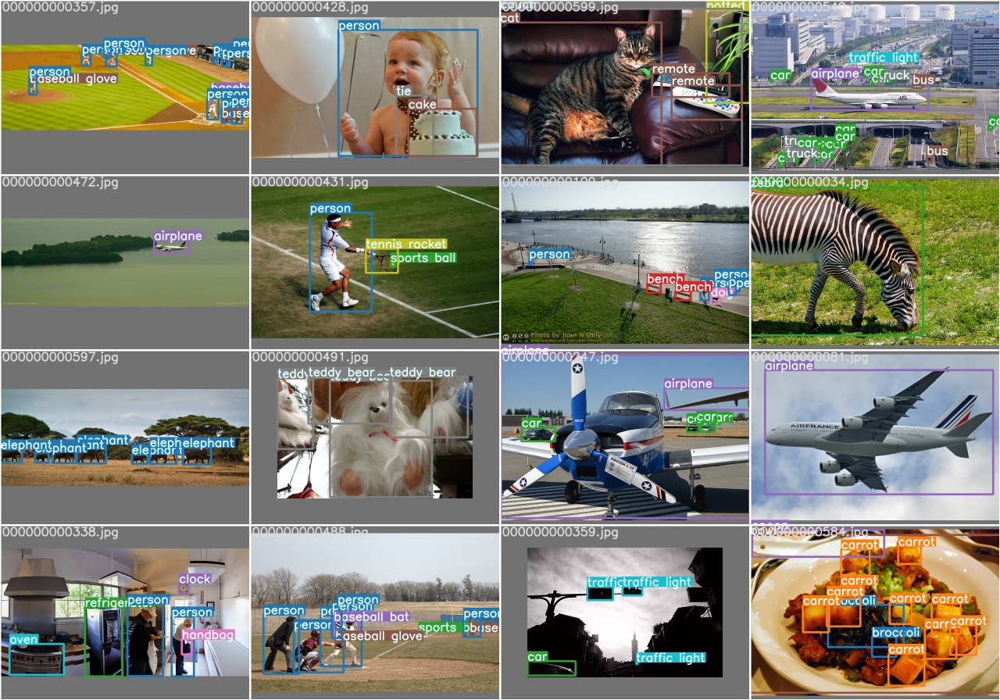

In [ ]:
Image(filename='runs/exp0/test_batch0_gt.jpg', width=900)  # view test image labels

View `test_batch0_pred.jpg` to see test batch 0 *predictions*.

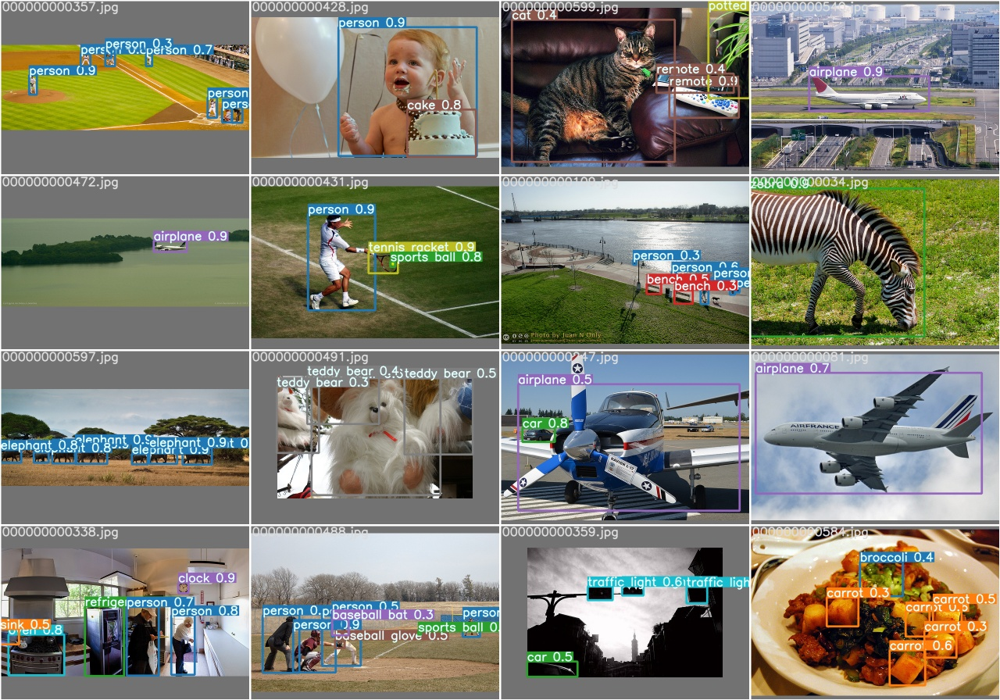

In [ ]:
Image(filename='runs/exp0/test_batch0_pred.jpg', width=900)  # view test image predictions

Training losses and performance metrics are saved to Tensorboard and also to a `runs/exp0/results.txt` logfile. `results.txt` is plotted as `results.png` after training completes. Partially completed `results.txt` files can be plotted with `from utils.general import plot_results; plot_results()`. Here we show YOLOv5s trained on coco128 to 300 epochs, starting from scratch (blue), and from pretrained `yolov5s.pt` (orange).

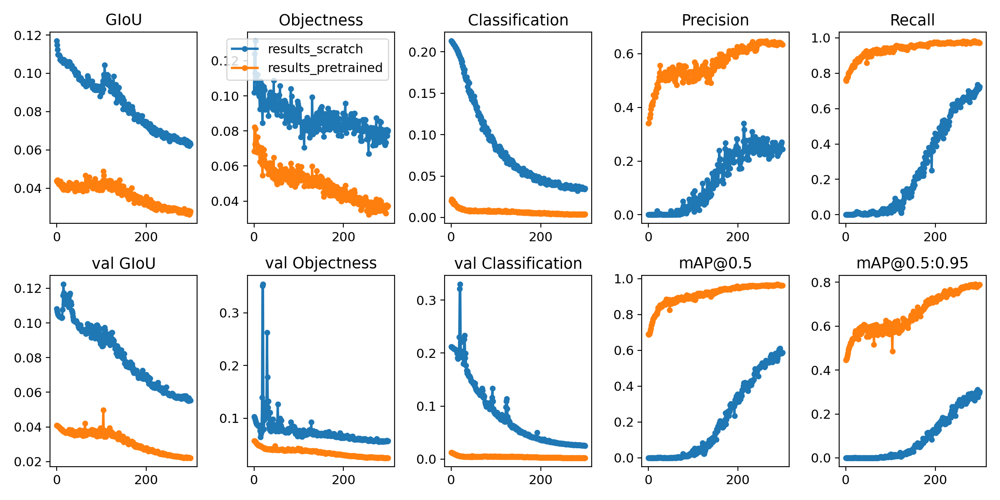

In [ ]:
from utils.general import plot_results; plot_results()  # plot results.txt files as results.png

# Environments

YOLOv5 may be run in any of the following up-to-date verified environments (with all dependencies including CUDA/CUDNN, Python and PyTorch preinstalled):

- **Google Colab Notebook** with free GPU: <a href="https://colab.research.google.com/github/ultralytics/yolov5/blob/master/tutorial.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"></a>
- **Kaggle Notebook** with free GPU: [https://www.kaggle.com/ultralytics/yolov5](https://www.kaggle.com/ultralytics/yolov5)
- **Google Cloud** Deep Learning VM. See [GCP Quickstart Guide](https://github.com/ultralytics/yolov5/wiki/GCP-Quickstart) 
- **Docker Image** https://hub.docker.com/r/ultralytics/yolov5. See [Docker Quickstart Guide](https://github.com/ultralytics/yolov5/wiki/Docker-Quickstart) ![Docker Pulls](https://img.shields.io/docker/pulls/ultralytics/yolov5?logo=docker)

In [ ]:
#!python detect.py --save-txt --names traffic.names --img-size 1024 --cfg cfg/yolov3-spp-23cls.cfg --weights weights/best_yolov3-traffic.pt --source data/test
%cd "/content/drive/My Drive/yolov5"
!python detect.py --save-txt --weights "/content/drive/MyDrive/Test_jhamela.pt" "/content/drive/MyDrive/yolov5l_full_train.pt" --img-size 1024 --conf-thres 0.2 --iou-thres 0.5 --source "/content/drive/My Drive/test_dhaka_ai"

/content/drive/My Drive/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.2, device='', img_size=1024, iou_thres=0.5, output='inference/output', save_txt=True, source='/content/drive/My Drive/test_dhaka_ai', update=False, view_img=False, weights=['/content/drive/MyDrive/Test_jhamela.pt', '/content/drive/MyDrive/yolov5l_full_train.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 188 layers, 2.15494e+07 parameters, 0 gradients
Fusing layers... 
Model Summary: 236 layers, 4.74724e+07 parameters, 0 gradients
Ensemble created with ['/content/drive/MyDrive/Test_jhamela.pt', '/content/drive/MyDrive/yolov5l_full_train.pt']

image 1/500 /content/drive/My Drive/test_dhaka_ai/Asraf_50_jpg.rf.7026694f0b9f37a6790982295c7e8663.jpg: 1024x1024 1 buss, 3 cars, 1 minivans, 3 motorbikes, 2 pickups, 2 rickshaws, 2 trucks, 1 vans, Done. (0.102s)
image 2/500 /content/drive/My Drive/test_dhaka_ai/Asraf_51_jpg.

In [ ]:
!pip install PyYAML==5.1

     |████████████████████████████████| 276kB 4.6MB/s 
  Created wheel for PyYAML: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=8a03d42075ef64a42a56a0f91fc0d31e86bed94b1cccac3c8edc6e86bbef45d4
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built PyYAML
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


In [ ]:
#!python test.py --h
#!python test.py --data traffic.data --cfg cfg/yolov3-spp-23cls.cfg --weights weights/best_yolov3-traffic.pt --img 1024 --augment
!python test.py --data "/content/dhaka_traffic.yaml" --weights "/content/drive/My Drive/0.28 ishrak.pt" --batch-size 16 --conf-thres 0.3 --iou-thres 0.6 --verbose --img 1024 --augment

Namespace(augment=True, batch_size=16, conf_thres=0.3, data='/content/dhaka_traffic.yaml', device='', img_size=1024, iou_thres=0.6, save_json=False, save_txt=False, single_cls=False, task='val', verbose=True, weights=['/content/drive/My Drive/0.28 ishrak.pt'])
Using CUDA device0 _CudaDeviceProperties(name='Tesla T4', total_memory=15079MB)

Fusing layers... 
Model Summary: 188 layers, 2.15494e+07 parameters, 0 gradients
Scanning labels /content/drive/My Drive/dhaka_traffic/labels/val_image.cache (500 found, 0 missing, 0 empty, 0 duplicate, for 500 images): 500it [00:00, 17275.58it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100% 32/32 [01:30<00:00,  2.82s/it]
                 all         500    4.23e+03       0.459       0.568        0.47       0.281
           ambulance         500          13       0.261       0.462        0.28       0.208
       auto rickshaw         500          63       0.548        0.81       0.689       0.381
 

In [ ]:
def clip_coords(boxes, img_shape):
    # Clip bounding xyxy bounding boxes to image shape (height, width)
    boxes[:, 0].clamp_(0, img_shape[1])  # x1
    boxes[:, 1].clamp_(0, img_shape[0])  # y1
    boxes[:, 2].clamp_(0, img_shape[1])  # x2
    boxes[:, 3].clamp_(0, img_shape[0])  # y2

In [ ]:
def non_max_suppression_with_wbf(prediction, conf_thres=0.1, iou_thres=0.6, merge=False, 
                        classes=None, agnostic=False, wbf=False, soft_nms=False, img_size=512, weight= None):
    """Performs Non-Maximum Suppression (NMS) on inference results
    Returns:
         detections with shape: nx6 (x1, y1, x2, y2, conf, cls)
    """

    nc = prediction[0].shape[1] - 5  # number of classes
    xc = np.array(prediction[..., 4]) > conf_thres  # candidates

    # Settings
    min_wh, max_wh = 2, 4096  # (pixels) minimum and maximum box width and height
    max_det = 300  # maximum number of detections per image
    time_limit = 10.0  # seconds to quit after
    redundant = True  # require redundant detections
    multi_label = nc > 1  # multiple labels per box (adds 0.5ms/img)

    t = time.time()
    output = [None] * prediction.shape[0]
    for xi, x in enumerate(prediction):  # image index, image inference
        # Apply constraints
        # x[((x[..., 2:4] < min_wh) | (x[..., 2:4] > max_wh)).any(1), 4] = 0  # width-height
        x = x[xc[xi]]  # confidence

        # If none remain process next image
        if not x.shape[0]:
            continue

        # Compute conf
        x[:, 5:] *= x[:, 4:5]  # conf = obj_conf * cls_conf

        # Box (center x, center y, width, height) to (x1, y1, x2, y2)
        box = xywh2xyxy(x[:, :4])

        # Detections matrix nx6 (xyxy, conf, cls)
        if multi_label:
            i, j = (x[:, 5:] > conf_thres).nonzero(as_tuple=False).T
            x = torch.cat((box[i], x[i, j + 5, None], j[:, None].float()), 1)
        else:  # best class only
            conf, j = x[:, 5:].max(1, keepdim=True)
            x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > conf_thres]

        # Filter by class
        if classes:
            x = x[(x[:, 5:6] == torch.tensor(classes, device=x.device)).any(1)]

        # Apply finite constraint
        # if not torch.isfinite(x).all():
        #     x = x[torch.isfinite(x).all(1)]

        # If none remain process next image
        n = x.shape[0]  # number of boxes
        if not n:
            continue

        # Sort by confidence
        # x = x[x[:, 4].argsort(descending=True)]

        # Batched NMS
        if wbf:
            clip_coords(x[:, :4], (img_size, img_size))
            x[:, :4] /= img_size
            boxes, scores, labels = weighted_boxes_fusion([x[:, :4]],[x[:, 4]],[x[:, 5]],iou_thr=iou_thres, weights=weight)
            if len(boxes) > 0:
                x = torch.zeros((len(boxes), 6), device=x.device)
                x[:,:4] = torch.tensor(boxes, device=x.device)
                x[:, 4] = torch.tensor(scores, device=x.device)
                x[:, 5] = torch.tensor(labels, device=x.device)
            else:
                x = torch.tensor([], device=x.device)
            x[:, :4] *= img_size
            output[xi] = x
        elif soft_nms:
          clip_coords(x[:, :4], (img_size, img_size))
          x[:, :4] /= img_size
          boxes, scores, labels = non_maximum_weighted([x[:, :4]],[x[:, 4]],[x[:, 5]],weights = weight, iou_thr=iou_thres)
          if len(boxes) > 0:
                x = torch.zeros((len(boxes), 6), device=x.device)
                x[:,:4] = torch.tensor(boxes, device=x.device)
                x[:, 4] = torch.tensor(scores, device=x.device)
                x[:, 5] = torch.tensor(labels, device=x.device)
          else:
                x = torch.tensor([], device=x.device)
          x[:, :4] *= img_size
          output[xi] = x

        else:
            c = x[:, 5:6] * (0 if agnostic else max_wh)  # classes
            boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
            i = torch.ops.torchvision.nms(boxes, scores, iou_thres)
            if i.shape[0] > max_det:  # limit detections
                i = i[:max_det]
            if merge and (1 < n < 3E3):  # Merge NMS (boxes merged using weighted mean)
                try:  # update boxes as boxes(i,4) = weights(i,n) * boxes(n,4)
                    iou = box_iou(boxes[i], boxes) > iou_thres  # iou matrix
                    weights = iou * scores[None]  # box weights
                    x[i, :4] = torch.mm(weights, x[:, :4]).float() / weights.sum(1, keepdim=True)  # merged boxes
                    if redundant:
                        i = i[iou.sum(1) > 1]  # require redundancy
                except:  # possible CUDA error https://github.com/ultralytics/yolov3/issues/1139
                    print(x, i, x.shape, i.shape)
                    pass

            output[xi] = x[i]
        if (time.time() - t) > time_limit:
            break  # time limit exceeded

    return output


In [ ]:
%cd "/content/drive/My Drive/yolov5"
from models import *  
from utils.datasets import *
#from utils.utils import *
from utils import torch_utils
 
from models.experimental import attempt_load
from utils.datasets import LoadStreams, LoadImages
from utils.general import (
    check_img_size, apply_classifier, scale_coords,
    xyxy2xywh, plot_one_box, strip_optimizer, set_logging)
from utils.torch_utils import select_device, load_classifier, time_synchronized
 
def detect(save_img=False):
    imgsz = opt.img_size 
    out, source, weights, half, view_img, save_txt = opt.output, opt.source, opt.weights, opt.half, opt.view_img, opt.save_txt
 
    # Initialize
    device = torch_utils.select_device(opt.device)
    if os.path.exists(out):
        shutil.rmtree(out)  # delete output folder
    os.makedirs(out)  # make new output folder
 
    # Initialize model
    model = attempt_load(weights, map_location=device)  # load FP32 model
    imgsz = check_img_size(imgsz, s=model.stride.max())  # check img_size
 
    # Eval mode
    model.to(device).eval()
 
    # Half precision
    half = half and device.type != 'cpu'  # half precision only supported on CUDA
    if half:
        model.half()
 
    # Set Dataloader
    vid_path, vid_writer = None, None
    save_img = True
    dataset = LoadImages(source, img_size=imgsz)
 
    # Get names and colors
    names = model.module.names if hasattr(model, 'module') else model.names
    colors = [[random.randint(0, 255) for _ in range(3)] for _ in range(len(names))]
 
    # Run inference
    t0 = time.time()
    img = torch.zeros((1, 3, imgsz, imgsz), device=device)  # init img
    _ = model(img.half() if half else img.float()) if device.type != 'cpu' else None  # run once
 
    results=[]
    for path, img, im0s, vid_cap in dataset:
        img = torch.from_numpy(img).to(device)
        img = img.half() if half else img.float()  # uint8 to fp16/32
        img /= 255.0  # 0 - 255 to 0.0 - 1.0
        if img.ndimension() == 3:
            img = img.unsqueeze(0)
 
        # Inference
        t1 = torch_utils.time_synchronized()
        pred = model(img, augment=opt.augment)[0]
        t2 = torch_utils.time_synchronized()
 
        # to float
        if half:
            pred = pred.float()
 
        # Apply NMS
        pred = non_max_suppression_with_wbf(pred, opt.conf_thres, opt.iou_thres, classes=opt.classes, 
                                            agnostic=opt.agnostic_nms, wbf = True, soft_nms = False, img_size=1024, weight = None)
 
        # Process detections
        for i, det in enumerate(pred):  # detections for image i
            
            p, s, im0 = path, '', im0s          
 
            save_path = str(Path(out) / Path(p).name)
            #print(p)
            s += '%gx%g ' % img.shape[2:]  # print string
            #print(s)
            gn = torch.tensor(im0.shape)[[1, 0, 1, 0]]  #  normalization gain whwh
            if det is not None and len(det):
                # Rescale boxes from imgsz to im0 size
                det[:, :4] = scale_coords(img.shape[2:], det[:, :4], im0.shape).round()
 
                # Print results
                for c in det[:, -1].unique():
                    n = (det[:, -1] == c).sum()  # detections per class
                    s += '%g %ss, ' % (n, names[int(c)])  # add to string
 
                xmin = []
                ymin = []
                xmax = []
                ymax = []
                scores = []
                labels_value=[]
                image_ids=[]
                # Write results
                for *xyxy, conf, cls in det:
                    if save_txt:  # Write to file
                        
                        conf_score = '%.2f' % (conf)
                        label_with_cls = '%s' % (names[int(cls)])
                        
                        labels_value.append(label_with_cls)
                        
                        xmin.append(int(xyxy[0]))
                        ymin.append(int(xyxy[1]))
                        xmax.append(int(xyxy[2]))
                        ymax.append(int(xyxy[3]))
                        
                        scores.append(conf_score)
                        image_ids.append(save_path)
 
                        xywh = (xyxy2xywh(torch.tensor(xyxy).view(1, 4)) / gn).view(-1).tolist()  # normalized xywh
                        with open(save_path[:save_path.rfind('.')] + '.txt', 'a') as file:
                            file.write(('%g ' * 5 + '\n') % (cls, *xywh))  # label format
 
                    if save_img or view_img:  # Add bbox to image
                        label = '%s %.2f' % (names[int(cls)], conf)
                        plot_one_box(xyxy, im0, label=label, color=colors[int(cls)])
 
            # Print time (inference + NMS)
            print('%sDone. (%.3fs)' % (s, t2 - t1))
 
            # Stream results
            if view_img:
                cv2.imshow(p, im0)
                if cv2.waitKey(1) == ord('q'):  # q to quit
                    raise StopIteration
 
            # Save results (image with detections)
            if save_img:
                if dataset.mode == 'images':
                    cv2.imwrite(save_path, im0)
        result = {
            'image_id': image_ids,
            'score': scores,
            'class': labels_value,
            'xmin': xmin,
            'ymin': ymin,
            'xmax': xmax,
            'ymax': ymax
 
            }
 
        results.append(result)
 
    if save_txt or save_img:
        print('Results saved to %s' % os.getcwd() + os.sep + out)
 
    print('Done. (%.3fs)' % (time.time() - t0))
    return results

/content/drive/My Drive/yolov5


In [ ]:
class opt:
    cfg=['/content/drive/My Drive/yolov5/models/yolov5m.yaml', "/content/drive/MyDrive/yolov5l full train.pt"]
    names='/content/drive/My Drive/traffic.names'
    weights=['/content/drive/MyDrive/Test_jhamela.pt', "/content/drive/MyDrive/yolov5l_full_train.pt"]
    source='/content/drive/My Drive/test_dhaka_ai'
    save_txt=True
    output='output'
    classes=False
    img_size=1024
    conf_thres=0.2
    iou_thres=0.5
    fourcc='mp4v'
    half=False
    device='cpu'
    view_img=False
    agnostic_nms=False
    augment=True

In [ ]:
%cd "/content/drive/My Drive/yolov5"
!git clone "https://github.com/ZFTurbo/Weighted-Boxes-Fusion.git"
%cd Weighted-Boxes-Fusion
!pip install ensemble boxes
from ensemble_boxes import *

/content/drive/My Drive/yolov5
fatal: destination path 'Weighted-Boxes-Fusion' already exists and is not an empty directory.
/content/drive/My Drive/yolov5/Weighted-Boxes-Fusion
  Created wheel for ensemble: filename=ensemble-0.0.dev1-cp36-none-any.whl size=4415 sha256=6d8c352b841495982ff2fa9b4c982ae1d56d31a759063a9dc0e5c0fa91ff09b4
  Stored in directory: /root/.cache/pip/wheels/40/0c/52/2fed70dec79c9412872fa27a2533dc8511feb96b3945143309
  Created wheel for boxes: filename=boxes-0.0.0-py2.py3-none-any.whl size=3100 sha256=d7a63f643c4e11361d53a89c22c94bc61b97ae58c44179240c8a420407077da9
  Stored in directory: /root/.cache/pip/wheels/a9/96/51/03d399bd64381959898649a6a453982e65582595cc44d10360
  Created wheel for pysut: filename=pysut-1.1-cp36-none-any.whl size=29089 sha256=4953b786977e954493c3087ec72e3c9c9e7e1517e132411f827e3847aaa92354
  Stored in directory: /root/.cache/pip/wheels/ed/f8/89/a198f4511cfcdd36335b15ba57215cf6d48444d751e8a615e6
  Created wheel for stats-arrays: filename=sta

In [ ]:
# predict results
with torch.no_grad():
    res=detect()

Fusing layers... 
Fusing layers... 
Ensemble created with ['/content/drive/MyDrive/Test_jhamela.pt', '/content/drive/MyDrive/yolov5l_full_train.pt']

image 1/500 /content/drive/My Drive/test_dhaka_ai/Asraf_50_jpg.rf.7026694f0b9f37a6790982295c7e8663.jpg: 1024x1024 1 buss, 3 cars, 1 minivans, 3 motorbikes, 3 pickups, 5 rickshaws, 2 trucks, 2 vans, Done. (18.282s)
image 2/500 /content/drive/My Drive/test_dhaka_ai/Asraf_51_jpg.rf.0e3516baf7509bc2c4a4aa8deea494c2.jpg: 1024x1024 4 buss, 4 cars, 3 minivans, 5 motorbikes, 2 pickups, 3 rickshaws, 1 suvs, 2 three wheelers (CNG)s, 1 trucks, 2 vans, Done. (18.213s)
image 3/500 /content/drive/My Drive/test_dhaka_ai/Asraf_52_jpg.rf.867869f276e6db3a09a84b99643df316.jpg: 1024x1024 1 bicycles, 2 buss, 1 cars, 1 minivans, 3 motorbikes, 3 pickups, 1 rickshaws, 1 vans, Done. (18.299s)
image 4/500 /content/drive/My Drive/test_dhaka_ai/Sabiha_(01)_jpg.rf.f935c7fc51a14c64e34c17a17c41cb1f.jpg: 1024x1024 1 cars, 1 minivans, 1 three wheelers (CNG)s, Done. (17.9

In [ ]:
import pandas as pd
import numpy as np
 
append_data=[] 
 
for i in range(len(res)):
  
  df = pd.DataFrame(res[i], columns = ['image_id','class','score','xmin','ymin','xmax','ymax'])
 
  append_data.append(df)
 
finl_results=pd.concat(append_data)
 
finl_results.image_id = [x.strip('output/') for x in finl_results.image_id]
 
finl_results['width'] = 1024
finl_results['height'] = 1024

In [ ]:
finl_results.head()
finl_results.to_csv("/content/dhaka_shundor_attempt_19.csv", index=False)

# Appendix

Optional extras below. Unit tests validate repo functionality and should be run on any PRs submitted.


In [ ]:
# Re-clone repo
%cd ..
!rm -rf yolov5 && git clone https://github.com/ultralytics/yolov5
%cd yolov5

In [ ]:
# Test GCP ckpt
%%shell
for x in best*
do
  gsutil cp gs://*/*/*/$x.pt .
  python test.py --weights $x.pt --data coco.yaml --img 672
done

In [ ]:
# YOLOv5 unit tests
%%shell
cd .. && rm -rf yolov5 && git clone https://github.com/ultralytics/yolov5 && cd yolov5
export PYTHONPATH="$PWD" # to run *.py. files in subdirectories
pip install -qr requirements.txt onnx
python3 -c "from utils.google_utils import *; gdrive_download('1n_oKgR81BJtqk75b00eAjdv03qVCQn2f', 'coco128.zip')" && mv ./coco128 ../
for x in yolov5s #yolov5m yolov5l yolov5x # models
do
  python train.py --weights $x.pt --cfg $x.yaml --epochs 4 --img 320 --device 0  # train
  for di in 0 cpu # inference devices
  do
    python detect.py --weights $x.pt --device $di  # detect official
    python detect.py --weights runs/exp0/weights/last.pt --device $di  # detect custom
    python test.py --weights $x.pt --device $di # test official
    python test.py --weights runs/exp0/weights/last.pt --device $di # test custom
  done
  python models/yolo.py --cfg $x.yaml # inspect
  python models/export.py --weights $x.pt --img 640 --batch 1 # export
done